<a href="https://colab.research.google.com/github/mohabxxx/Dog-Names/blob/main/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print(hub.__version__)

print("GPU avaliable" if tf.config.list_physical_devices("GPU") else "Not avaliable")

0.14.0
GPU avaliable


In [ ]:
import pandas as pd
labels_csv=pd.read_csv('drive/MyDrive/dog vision/dog-breed-identification/labels.csv')
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [ ]:
labels_csv

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [ ]:
labels_csv.breed.value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

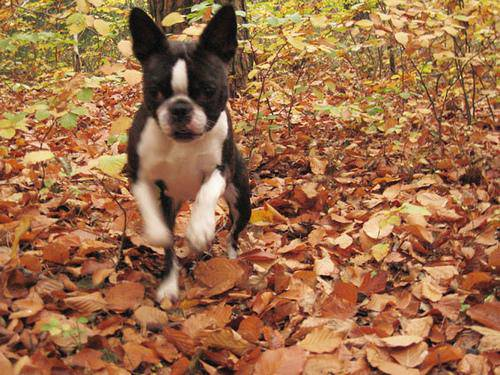

In [ ]:
from IPython.display import Image
Image('drive/MyDrive/dog vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg')


In [ ]:
filenames=["drive/MyDrive/dog vision/dog-breed-identification/train/"+fname+'.jpg' for fname in labels_csv.id]

filenames[:10]

['drive/MyDrive/dog vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(filenames)

10222

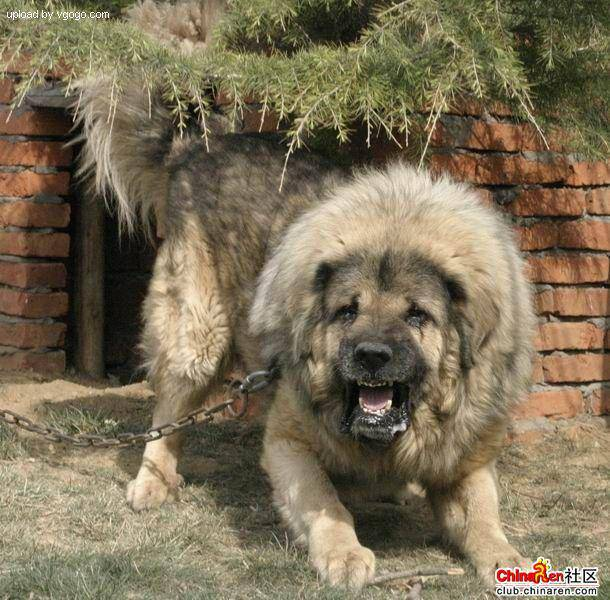

In [ ]:
Image(filenames[9000])

In [ ]:
import numpy as np
labels = labels_csv.breed
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
x=filenames
y=boolean_labels


In [ ]:
NUM_IMAGES=1000
from sklearn.model_selection import train_test_split
x_train , x_val , y_train , y_val=train_test_split(x[:NUM_IMAGES],
                                                   y[:NUM_IMAGES],
                                                   test_size=0.2,
                                                   random_state=42)
len(x_train) , len(x_val) , len(y_train) , len(y_val)

(800, 200, 800, 200)

In [ ]:
x_train[:2] , y_train[:2]

(['drive/MyDrive/dog vision/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog vision/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fa

In [ ]:
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
IMG_SIZE=224

def process_img(image_path,img_size=IMG_SIZE):
  image=tf.io.read_file(image_path)

  image=tf.image.decode_jpeg(image,channels=3)

  image=tf.image.convert_image_dtype(image,tf.float32)

  image=tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])

  return image

In [ ]:
def get_image_label(image_path,label):
  image=process_img(image_path)
  return image , label

In [ ]:
(process_img(x[42]) ,tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
BATCH_SIZE=32
def creat_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False , test_data=False):
  if test_data:
    print("Creating test data batches....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch=data.map(process_img).batch(batch_size)
    return data_batch

  elif valid_data:
    print("Creating valid data batches....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                             tf.constant(y)))
    data_batch=data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print("Creating training data batches....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    data=data.shuffle(buffer_size=len(x))
    data=data.map(get_image_label)
    data_batch=data.batch(batch_size)
  return data_batch


In [ ]:
train_data=creat_data_batches(x_train,y_train)

val_data=creat_data_batches(x_val,y_val,valid_data=True)

Creating training data batches....
Creating valid data batches....


In [ ]:
train_data.element_spec , val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt
def show_25_images(images,labels):
  plt.figure(figsize=(10,10))
  for i in range (25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis('off')


In [ ]:
train_images , train_labels=next(train_data.as_numpy_iterator())
train_images , train_labels

(array([[[[0.13020772, 0.09792481, 0.0743091 ],
          [0.17114848, 0.11470589, 0.09890082],
          [0.18884243, 0.11101817, 0.10180885],
          ...,
          [0.4357284 , 0.58669454, 0.5026029 ],
          [0.704808  , 0.8224131 , 0.76782626],
          [0.7067402 , 0.8115116 , 0.76025105]],
 
         [[0.14399886, 0.11305336, 0.07492309],
          [0.17630991, 0.1220382 , 0.09051121],
          [0.2028349 , 0.12727278, 0.10248413],
          ...,
          [0.68452424, 0.8327749 , 0.75504386],
          [0.65584254, 0.787489  , 0.6942735 ],
          [0.6379027 , 0.7666699 , 0.66235626]],
 
         [[0.1373368 , 0.10134242, 0.05390969],
          [0.1446785 , 0.09145597, 0.04821241],
          [0.21567255, 0.14445406, 0.10581235],
          ...,
          [0.4801248 , 0.58879447, 0.5294809 ],
          [0.5021611 , 0.64855593, 0.5234157 ],
          [0.6328659 , 0.78650737, 0.64140934]],
 
         ...,
 
         [[0.31408826, 0.2944804 , 0.27879414],
          [0.31788

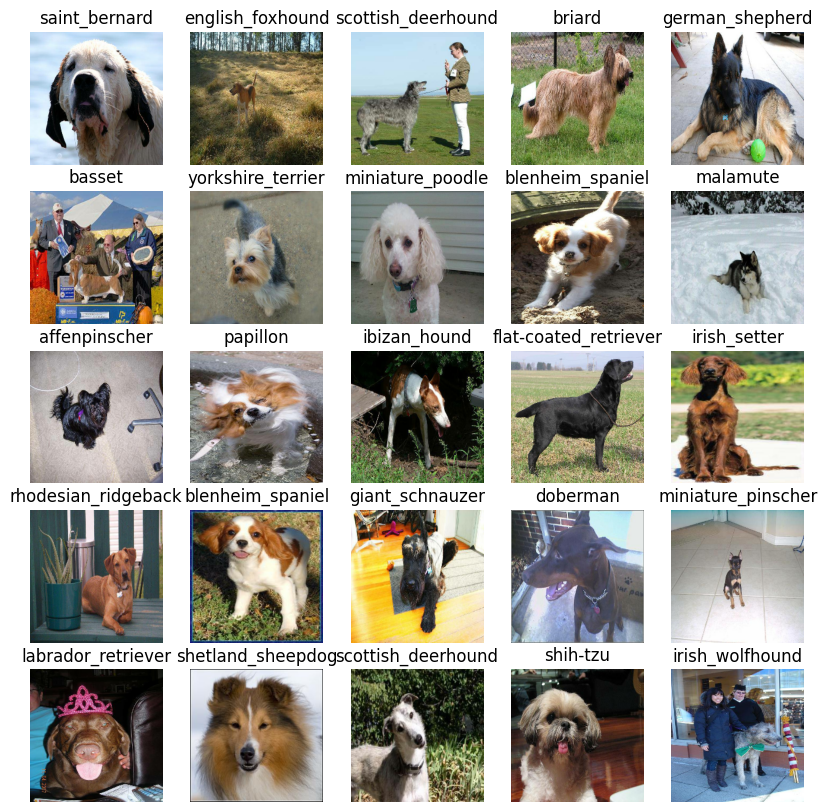

In [ ]:
show_25_images(train_images, train_labels)

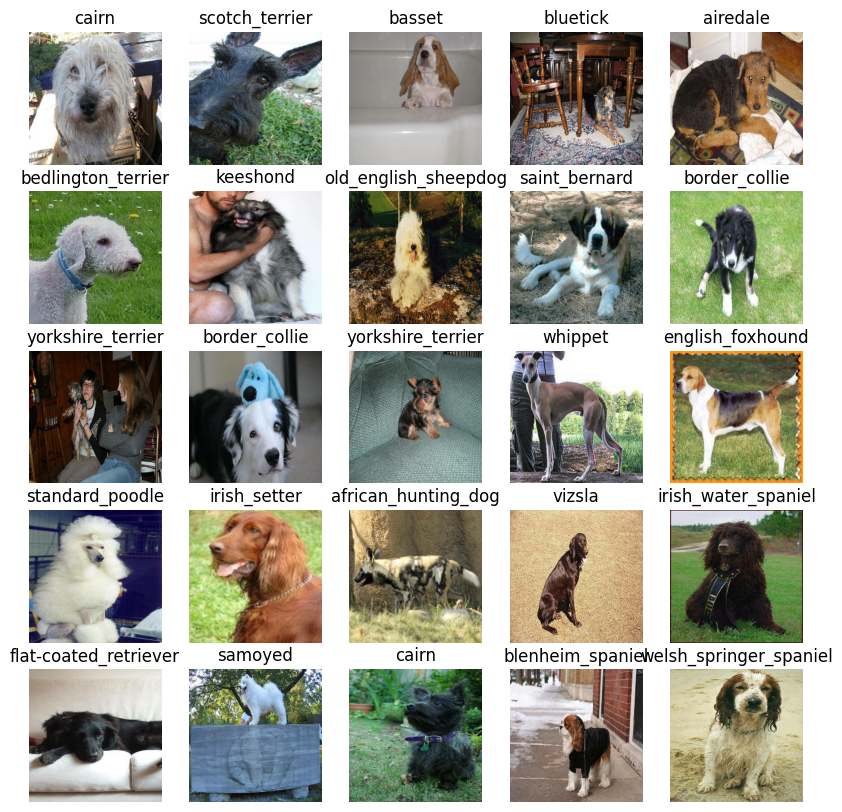

In [ ]:
val_images , val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

In [ ]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]

OUTPUT_SHAP=len(unique_breeds)

MODEL_URL='https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

In [ ]:
def create_model (input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAP,model_url=MODEL_URL):
  print(f"Bulding model with {model_url}")

  model=tf.keras.Sequential([
      hub.KerasLayer(model_url),
      tf.keras.layers.Dense(units=output_shape ,
                            activation='softmax')
  ])
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy']
                )
  model.build(input_shape)
  return model

In [ ]:
model=create_model()
model.summary()

Bulding model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
%load_ext tensorboard

In [ ]:
import datetime
import os
def create_tenorboard_callback():
  logdir=os.path.join('drive/MyDrive/dog vision/dog-breed-identification/logs',
                      datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                patience=3)

In [ ]:
NUM_EPOCHS=100 #@param {type:'slider' ,min:10,max:100,step:10}


In [ ]:
def train_model():
  model=create_model()
  tesnorboard=create_tenorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tesnorboard,early_stopping])
  return model

In [ ]:
model=train_model()

Bulding model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 323s 12s/step - loss: 4.6369 - accuracy: 0.1050 - val_loss: 3.7695 - val_accuracy: 0.1850
Epoch 2/100
25/25 [==============================] - 3s 127ms/step - loss: 1.6495 - accuracy: 0.6737 - val_loss: 2.3809 - val_accuracy: 0.4400
Epoch 3/100
25/25 [==============================] - 4s 147ms/step - loss: 0.5760 - accuracy: 0.9325 - val_loss: 1.8791 - val_accuracy: 0.5400
Epoch 4/100
25/25 [==============================] - 3s 123ms/step - loss: 0.2577 - accuracy: 0.9887 - val_loss: 1.6526 - val_accuracy: 0.5850
Epoch 5/100
25/25 [==============================] - 3s 118ms/step - loss: 0.1460 - accuracy: 0.9987 - val_loss: 1.5726 - val_accuracy: 0.5900
Epoch 6/100
25/25 [==============================] - 5s 192ms/step - loss: 0.1000 - accuracy: 1.0000 - val_loss: 1.5071 - val_accuracy: 0.6150
Epoch 7/100
25/25 [==============================] 

In [ ]:

%tensorboard --logdir drive/MyDrive/dog\ vision/dog-breed-identification/logs --port=8008


<IPython.core.display.Javascript object>

In [ ]:
preds=model.predict(val_data,verbose=1)
preds

7/7 [==============================] - 3s 148ms/step


array([[5.20509575e-03, 2.64014699e-04, 7.34220201e-04, ...,
        1.72179483e-04, 3.67391694e-05, 8.26925389e-04],
       [9.14579374e-04, 9.94265894e-04, 9.14057065e-03, ...,
        8.36835185e-04, 1.99167756e-03, 3.30152223e-04],
       [3.32420284e-04, 1.57715203e-05, 1.78906394e-05, ...,
        8.18433364e-06, 8.95761332e-05, 7.37624796e-05],
       ...,
       [1.60468026e-05, 1.10815803e-04, 1.16282026e-04, ...,
        5.03476167e-06, 2.72504676e-05, 1.44499078e-04],
       [3.65170604e-03, 1.67410108e-04, 9.50379035e-05, ...,
        1.90725943e-04, 1.19013748e-04, 4.51230956e-03],
       [1.04618724e-03, 8.66918617e-06, 1.97316427e-03, ...,
        4.67656553e-02, 3.66435183e-04, 3.43062020e-05]], dtype=float32)

In [ ]:
preds[0]

array([5.20509575e-03, 2.64014699e-04, 7.34220201e-04, 3.65865155e-04,
       2.64500477e-03, 2.26877910e-05, 6.45919740e-02, 7.54126057e-04,
       6.75646239e-04, 6.32922922e-04, 4.59171773e-04, 3.12921067e-04,
       6.84830709e-04, 4.34423011e-04, 5.20255184e-04, 2.38528335e-03,
       9.26548964e-05, 1.81065887e-01, 9.78802054e-05, 7.17320363e-05,
       3.34774697e-04, 1.45859769e-04, 6.89194849e-06, 7.55013723e-04,
       2.74230639e-04, 1.94996363e-04, 2.14914769e-01, 2.49075296e-04,
       2.23244322e-04, 1.35352500e-04, 2.40856927e-04, 8.00901791e-04,
       6.40775193e-04, 9.79308061e-06, 3.63558298e-04, 1.09297391e-02,
       1.25122651e-05, 8.51621386e-04, 3.46255925e-04, 1.27373220e-04,
       2.33024918e-03, 5.08362937e-05, 6.09986659e-04, 1.27916326e-04,
       3.57480858e-05, 1.60603915e-04, 2.21056998e-05, 8.52342127e-05,
       7.63016928e-04, 1.52039021e-04, 9.95598821e-05, 7.07394793e-04,
       8.96365033e-04, 8.41243891e-05, 9.74299546e-05, 1.46581617e-04,
      

In [ ]:
index=5
print(np.max(preds[index]))
print(unique_breeds[preds[index].argmax()])

0.95468676
bedlington_terrier


In [ ]:
def get_pred_labels(preds_prob):
  return unique_breeds[np.argmax(preds_prob)]

pred_label=get_pred_labels(preds[81])
pred_label

'dingo'

In [ ]:
def unbatchify(data):
  images_=[]
  labels=[]
  for image,label in val_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images_ , labels

val_images , val_labels = unbatchify(val_data)
val_images[0] , val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(pred_probs,labels,images,n=0):
  pred_prob, true_label , image =pred_probs[n] , labels[n],images[n]
  pred_label=get_pred_labels(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  if pred_label == true_label:
    color='green'
  else:
    color='red'
  plt.title("{} {:2.0f}% {}".format(pred_label ,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

In [ ]:
plot_pred(pred_probs=preds,
          labels=val_labels,
          images=val_images)

NameError: ignored

In [ ]:
len(val_labels)

200

In [ ]:
len(preds)

200

In [ ]:
def all_preds_labels(data,breeds):
  preds=[]
  for image in data :
    preds.append(breeds[image.argmax()])
  return preds
all_preds=all_preds_labels(preds,unique_breeds)


['cairn',
 'scotch_terrier',
 'basset',
 'bluetick',
 'airedale',
 'bedlington_terrier',
 'norwegian_elkhound',
 'old_english_sheepdog',
 'saint_bernard',
 'collie',
 'italian_greyhound',
 'saint_bernard',
 'silky_terrier',
 'whippet',
 'english_foxhound',
 'miniature_poodle',
 'irish_setter',
 'african_hunting_dog',
 'labrador_retriever',
 'irish_water_spaniel',
 'collie',
 'samoyed',
 'miniature_schnauzer',
 'blenheim_spaniel',
 'welsh_springer_spaniel',
 'scottish_deerhound',
 'komondor',
 'cairn',
 'cardigan',
 'african_hunting_dog',
 'dandie_dinmont',
 'walker_hound',
 'walker_hound',
 'cairn',
 'malamute',
 'malamute',
 'welsh_springer_spaniel',
 'doberman',
 'dhole',
 'kuvasz',
 'labrador_retriever',
 'wire-haired_fox_terrier',
 'walker_hound',
 'collie',
 'toy_poodle',
 'groenendael',
 'boston_bull',
 'miniature_poodle',
 'miniature_poodle',
 'chihuahua',
 'staffordshire_bullterrier',
 'redbone',
 'norfolk_terrier',
 'pug',
 'toy_poodle',
 'miniature_schnauzer',
 'border_terrie

In [ ]:
unique_breeds[preds[20].argmax()]

'collie'

In [ ]:
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(val_labels,all_preds)
cm

array([[1, 0, 0, ..., 0, 0, 0],
       [0, 4, 0, ..., 0, 0, 0],
       [0, 0, 2, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 2, 0, 0],
       [0, 0, 0, ..., 0, 2, 0],
       [0, 0, 0, ..., 0, 0, 0]])

<Axes: >

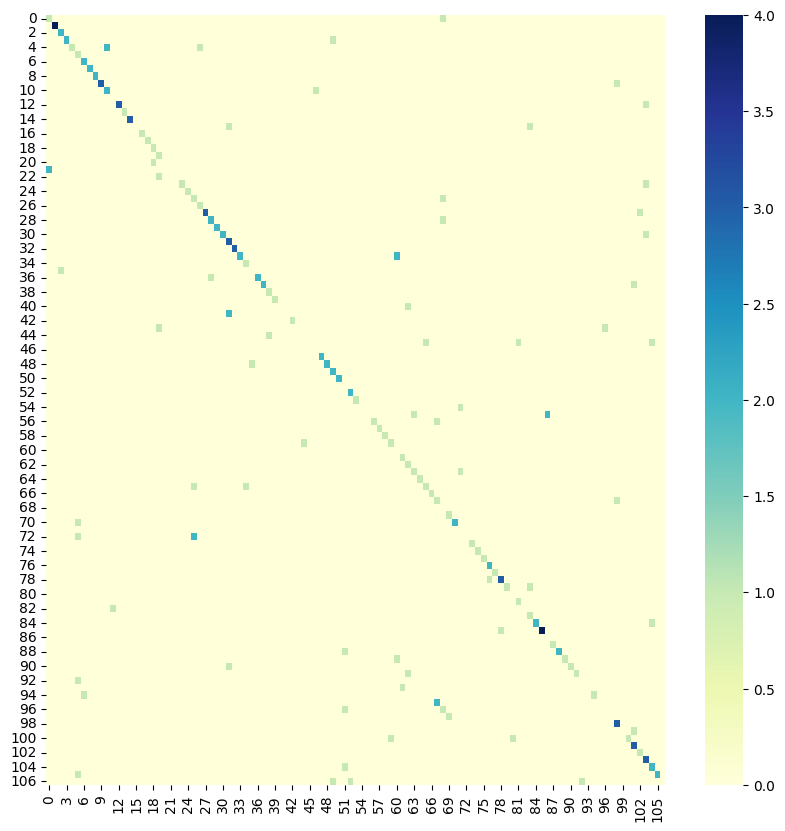

In [ ]:
import seaborn as sns
plt.figure(figsize=(10, 10))

# Create heatmap
sns.heatmap(cm,cmap="YlGnBu")

In [ ]:
def save_model(model,suffix=None):
  modeldir=os.path.join('drive/MyDrive/dog vision/dog-breed-identification/models', datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  model_path= modeldir + '-'+ suffix + '.h5'
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_model(model,suffix='1000-images-mobilenetv2-Adam')


'drive/MyDrive/dog vision/dog-breed-identification/models/20230815-110351-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_image_model=load_model('drive/MyDrive/dog vision/dog-breed-identification/models/20230815-110351-1000-images-mobilenetv2-Adam.h5')

In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 117ms/step - loss: 1.4075 - accuracy: 0.6350


[1.4074773788452148, 0.6349999904632568]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 117ms/step - loss: 1.4075 - accuracy: 0.6350


[1.4074773788452148, 0.6349999904632568]

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
full_data=creat_data_batches(x,y)

Creating training data batches....


In [ ]:
full_model=create_model()

Bulding model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
full_model_tensorboard=create_tenorboard_callback()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                           patience=3)


In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3510s 11s/step - loss: 1.3543 - accuracy: 0.6697
Epoch 2/100
320/320 [==============================] - 36s 113ms/step - loss: 0.3961 - accuracy: 0.8836
Epoch 3/100
320/320 [==============================] - 36s 113ms/step - loss: 0.2370 - accuracy: 0.9349
Epoch 4/100
320/320 [==============================] - 34s 107ms/step - loss: 0.1542 - accuracy: 0.9637
Epoch 5/100
320/320 [==============================] - 35s 109ms/step - loss: 0.1045 - accuracy: 0.9794
Epoch 6/100
320/320 [==============================] - 38s 117ms/step - loss: 0.0777 - accuracy: 0.9866
Epoch 7/100
320/320 [==============================] - 36s 113ms/step - loss: 0.0585 - accuracy: 0.9924
Epoch 8/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0461 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0374 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 34s 105m

In [ ]:
save_model(full_model,suffix='full-image-set-mobilenetv2-Adam')

'drive/MyDrive/dog vision/dog-breed-identification/models/20230815-123205-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model=load_model('drive/MyDrive/dog vision/dog-breed-identification/models/20230815-123205-full-image-set-mobilenetv2-Adam.h5')

In [ ]:
test_path='drive/MyDrive/dog vision/dog-breed-identification/test/'
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/dog vision/dog-breed-identification/test/e5e51d0dfc3ccdb74de51933b2671742.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/test/e2976affb6d88a3e627ff8c31844f20a.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/test/e425ab04e3a0d4464cda46a076964770.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/test/e0bf90705facb623a6f36046cc495659.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/test/df903a0522873bebca93d1d93bc60bc4.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/test/e5fa615e36dc3b2b3f554aa5097a6ece.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/test/e71fde4ddc4c1adf9b4cf397e3904f74.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/test/e79030be9c9769f3604474aea16039bd.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/test/e3a43510b5f90bfb9fb050c77cabb079.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification/test/df0063da2179d3ac623296f2c164aeb6.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data=creat_data_batches(test_filenames,test_data=True)

Creating test data batches....


In [ ]:
test_preds =loaded_full_model.predict(test_data,
                              verbose=1)

324/324 [==============================] - 3778s 12s/step
